In [ ]:
!git clone https://github.com/tjwei/stylegan2_workshop

Cloning into 'stylegan2_workshop'...
remote: Enumerating objects: 92, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (85/85), done.
remote: Total 92 (delta 10), reused 76 (delta 5), pack-reused 0
Unpacking objects: 100% (92/92), done.


In [ ]:
!ls

sample_data  stylegan2_workshop


In [ ]:
!mv stylegan2_workshop/* .

In [ ]:
!ls

align_images.py  pretrained_networks.py  sample_images
dnnlib		 project_images		 stylegan2encoder_20200904.ipynb
ffhq_dataset	 project_images.py	 stylegan2encoder.ipynb
LICENSE		 projector.py		 stylegan2_workshop
LICENSE.txt	 README.md		 test_nvcc.cu
metrics		 sample_data		 training


In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
import glob
from pathlib import Path

sample_images = [str(p) for p in Path("sample_images").glob("[0~9]*")]
sample_images

['sample_images/00003.png',
 'sample_images/00006.png',
 'sample_images/00005.png',
 'sample_images/00007.png',
 'sample_images/00001.png',
 'sample_images/00004.png',
 'sample_images/00002.png',
 'sample_images/00000.png']

## Face alignment

In [ ]:
import os
import sys
import bz2
from tensorflow.keras.utils import get_file
from ffhq_dataset.face_alignment import image_align
from ffhq_dataset.landmarks_detector import LandmarksDetector

In [ ]:
LANDMARKS_DATA_FILENAME = "shape_predictor_68_face_landmarks.dat"
LANDMARKS_MODEL_URL = f'http://dlib.net/files/{LANDMARKS_DATA_FILENAME}.bz2'
if not Path(LANDMARKS_DATA_FILENAME).exists():
    data_bz = get_file(f'{LANDMARKS_DATA_FILENAME}.bz2', 
                                               LANDMARKS_MODEL_URL, cache_subdir='temp')
    with open(LANDMARKS_DATA_FILENAME, 'bw') as f: 
        f.write(bz2.open(data_bz).read())
landmarks_detector = LandmarksDetector(LANDMARKS_DATA_FILENAME)

64045056/64040097 [==============================] - 2s 0us/step


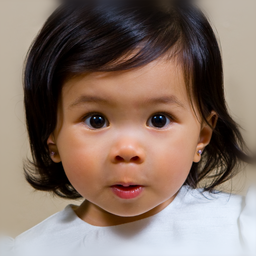

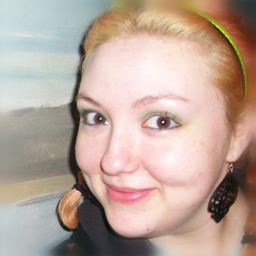

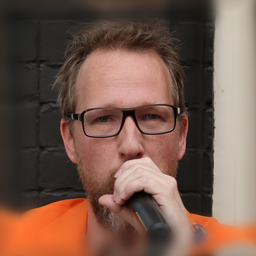

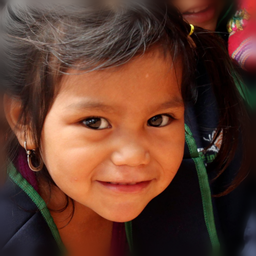

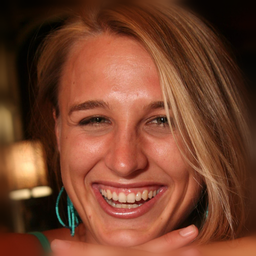

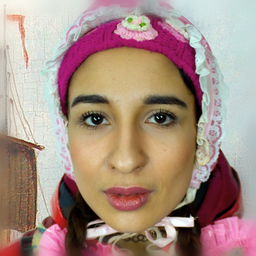

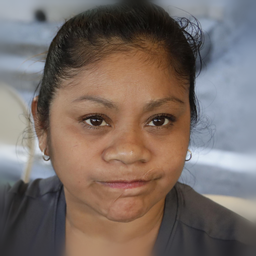

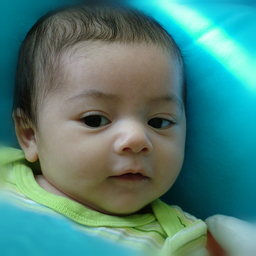

In [ ]:
from PIL import Image
from IPython.display import display, clear_output
aligned_faces = []
for unaligned_img_fn in sample_images:
    for face_landmarks in landmarks_detector.get_landmarks(unaligned_img_fn):
        aligned_img = image_align(unaligned_img_fn, face_landmarks)
        aligned_faces.append(aligned_img)
        display(aligned_img.resize((256,256), Image.LANCZOS))

## Project Images

In [ ]:
import os
import numpy as np

import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks
import projector
from training import dataset
from training import misc

### Set up the projector

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving 00000.png to 00000.png
User uploaded file "00000.png" with length 1488194 bytes


In [ ]:
!wget "https://drive.google.com/uc?export=download&id=1M6fmCx-ePeZA-MQrxpvkY5RzgnMAHWb9"

--2021-06-17 21:23:41--  https://drive.google.com/uc?export=download&id=1M6fmCx-ePeZA-MQrxpvkY5RzgnMAHWb9
Resolving drive.google.com (drive.google.com)... 74.125.142.101, 74.125.142.113, 74.125.142.102, ...
Connecting to drive.google.com (drive.google.com)|74.125.142.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0k-bs-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/skrh4l8aafgdjotfq9hb2ro5cfpfu29m/1623964950000/08038398371578299425/*/1M6fmCx-ePeZA-MQrxpvkY5RzgnMAHWb9?e=download [following]
--2021-06-17 21:23:43--  https://doc-0k-bs-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/skrh4l8aafgdjotfq9hb2ro5cfpfu29m/1623964950000/08038398371578299425/*/1M6fmCx-ePeZA-MQrxpvkY5RzgnMAHWb9?e=download
Resolving doc-0k-bs-docs.googleusercontent.com (doc-0k-bs-docs.googleusercontent.com)... 74.125.142.132, 2607:f8b0:400e:c08::84
Connecting to doc-0k-bs-docs.googleusercontent.com (doc-0k

In [ ]:
_G, _D, Gs = pretrained_networks.load_networks('gdrive:networks/stylegan2-ffhq-config-f.pkl')

# vgg16_pkl url: https://drive.google.com/uc?id=1N2-m9qszOeVC9Tq77WxsLnuWwOedQiD2
proj = projector.Projector(
    vgg16_pkl             = 'https://drive.google.com/uc?export=download&id=1M6fmCx-ePeZA-MQrxpvkY5RzgnMAHWb9',
    num_steps             = 300,
    initial_learning_rate = 0.1,
    initial_noise_factor  = 0.05,
    verbose               = True
)

proj.set_network(Gs)

Projector: Finding W midpoint and stddev using 10000 samples...
Projector: std = 42.4506
Projector: Setting up noise inputs...
Projector: G_synthesis/noise0 <tf.Variable 'G_synthesis_4/noise0:0' shape=(1, 1, 4, 4) dtype=float32_ref>
Projector: G_synthesis/noise1 <tf.Variable 'G_synthesis_4/noise1:0' shape=(1, 1, 8, 8) dtype=float32_ref>
Projector: G_synthesis/noise2 <tf.Variable 'G_synthesis_4/noise2:0' shape=(1, 1, 8, 8) dtype=float32_ref>
Projector: G_synthesis/noise3 <tf.Variable 'G_synthesis_4/noise3:0' shape=(1, 1, 16, 16) dtype=float32_ref>
Projector: G_synthesis/noise4 <tf.Variable 'G_synthesis_4/noise4:0' shape=(1, 1, 16, 16) dtype=float32_ref>
Projector: G_synthesis/noise5 <tf.Variable 'G_synthesis_4/noise5:0' shape=(1, 1, 32, 32) dtype=float32_ref>
Projector: G_synthesis/noise6 <tf.Variable 'G_synthesis_4/noise6:0' shape=(1, 1, 32, 32) dtype=float32_ref>
Projector: G_synthesis/noise7 <tf.Variable 'G_synthesis_4/noise7:0' shape=(1, 1, 64, 64) dtype=float32_ref>
Projector: G_sy

### Find latent code

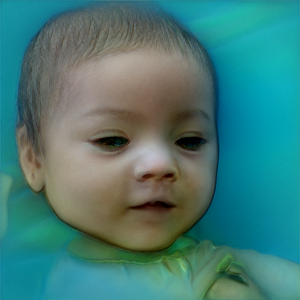

In [ ]:
results = []
for target_face in aligned_faces:
    # convert Image to np array
    images = np.transpose(np.array(target_face), [2,0,1])[None, ...]
    images = misc.adjust_dynamic_range(images, [0, 255], [-1, 1])
    proj.start(images)
    while proj.get_cur_step() < proj.num_steps:
        print('%d / %d ... ' % (proj.get_cur_step(), proj.num_steps))
        proj.step()
        clear_output(True)
        img = np.transpose(proj.get_images()[0], [1,2,0])
        img = ((img+1)*127.5).clip(0, 255).astype('uint8')
        display(Image.fromarray(img).resize((300,300)))
    filename = os.path.join('project_images/', os.path.basename('project_images/')[:-4] + '.npy')
    np.save(filename, proj.get_dlatents()[0])
    results.append((img, proj.get_dlatents()))

### Generate

In [113]:
!python project_images.py sample_images project_images

Loading networks from "gdrive:networks/stylegan2-ffhq-config-f.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
2021-06-18 01:05:37.631301: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 16777216 exceeds 10% of system memory.
Loading images from ".stylegan2-tmp/dataset/images"
Creating dataset ".stylegan2-tmp/dataset/tfrecords"
Added 1 images.
tcmalloc: large alloc 4294967296 bytes == 0x55d130ea0000 @  0x7f5493ff8001 0x7f54914d754f 0x7f5491527b58 0x7f549152bb17 0x7f54915ca203 0x55d0dba5ad54 0x55d0dba5aa50 0x55d0dbacf105 0x55d0dbac97ad 0x55d0dba5cc9f 0x55d0dba9dd79 0x55d0dba9acc4 0x55d0dba5cea1 0x55d0dbacbbb5 0x55d0dbac94ae 0x55d0dba5c3ea 0x55d0dbacb32a 0x55d0dbac94ae 0x55d0dba5c3ea 0x55d0dbacb32a 0x55d0dbac97ad 0x55d0dba5c3ea 0x55d0dbaca3b5 0x55d0dbac94ae 0x55d0dbac91b3 0x55d0dbb93182 0x55d0dbb934fd 0x55d0dbb933a6 0x55d0dbb6a723 0x55d0dbb6a3cc 

In [114]:
Gs_syn_kwargs = dnnlib.EasyDict(output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True),
                               randomize_noise = False,
                               minibatch_size = 4)

In [125]:
# Use above generated dlatents
# dlatents = np.concatenate([r[1] for r in results], axis=0)
# Use precalculated dlatents
dlatent_saved_files = Path('project_images/').glob('[0~9]*.npy')
dlatents = np.array([np.load(f) for f in dlatent_saved_files])
dlatents.shape


(8, 18, 512)

In [126]:
all_images = Gs.components.synthesis.run(dlatents, **Gs_syn_kwargs)
all_images.shape

(8, 1024, 1024, 3)

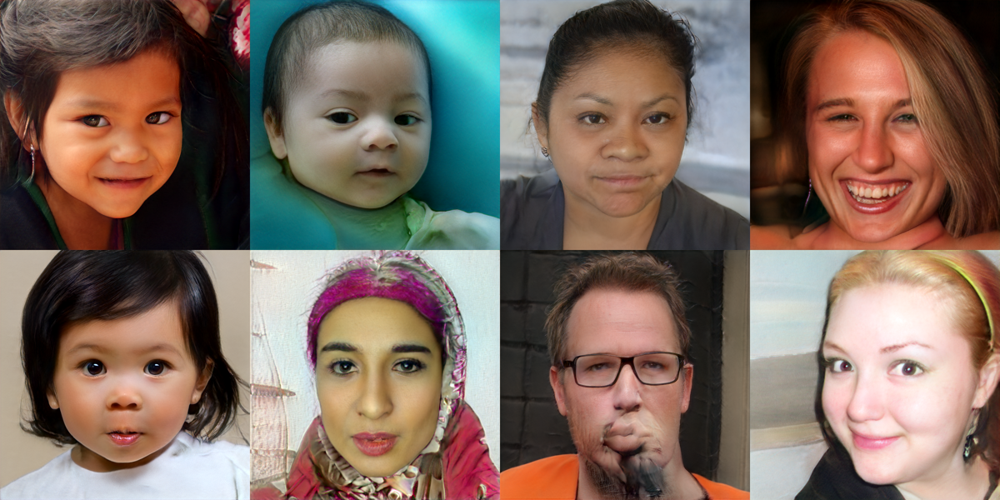

In [128]:
img = all_images.reshape((2,4, 1024, 1024, 3))
img = np.transpose(img, [0,2,1,3,4]).reshape((2*1024, 4*1024, 3))
img = Image.fromarray(img)
img = img.resize((4*300, 2*300))
img

### Style Mixing

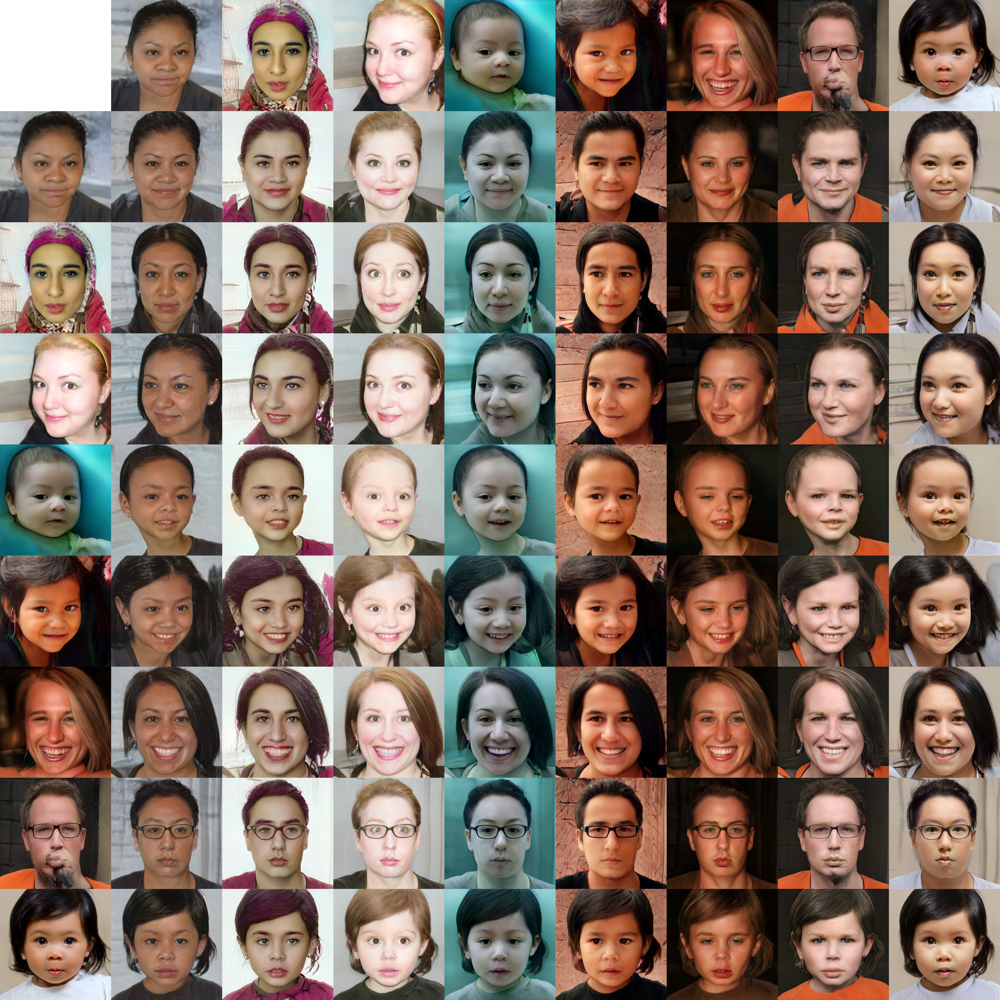

In [129]:
np.random.shuffle(dlatents)
CONTENT_FEATURES = range(0, 6)
N_STYLES = 8
N_CONTENTS = 8
IMG_W, IMG_H = 300, 300
truncation_psi = 1.0

style_dlatents = dlatents[:N_STYLES]
content_dlatents = dlatents[-N_CONTENTS:]
canvas = Image.new('RGB', (IMG_W*(N_STYLES+1), IMG_H*(N_CONTENTS+1)), 'white') 
dlatent_avg = Gs.get_var('dlatent_avg')
for i in range(-1, N_STYLES):
    row_dlatents = style_dlatents.copy()
    if i>=0:
        content_dlatent = content_dlatents[i]
        row_dlatents[:, CONTENT_FEATURES] = content_dlatent[CONTENT_FEATURES]
        # truncation
        row_dlatents = dlatent_avg + (row_dlatents-dlatent_avg).clip(-truncation_psi, truncation_psi)
        # concat content and mixed images
        row_dlatents = np.concatenate([content_dlatent[None, ...], row_dlatents], axis=0)

    row_images = Gs.components.synthesis.run(row_dlatents, **Gs_syn_kwargs)
    n_imgs = row_images.shape[0]
    img = np.transpose(row_images, [1,0,2,3]).reshape((1024, -1, 3))
    img = Image.fromarray(img).resize((IMG_W*n_imgs, IMG_H))
    canvas.paste(img, ( IMG_W*(N_STYLES-n_imgs+1) , IMG_H*(i+1)))
display(canvas)
    

**蒐集 5 張非真實人臉照片, 試著用 projector 還原**

In [66]:
def projection(proj, target_face):
    proj.num_steps = 1000
    # convert Image to np array
    images = np.transpose(np.array(target_face), [2,0,1])[None, ...]
    images = misc.adjust_dynamic_range(images, [0, 255], [-1, 1])
    proj.start(images)
    while proj.get_cur_step() < proj.num_steps:
        print('%d / %d ... ' % (proj.get_cur_step(), proj.num_steps))
        proj.step()
        clear_output(True)
        img = np.transpose(proj.get_images()[0], [1,2,0])
        img = ((img+1)*127.5).clip(0, 255).astype('uint8')
        display(Image.fromarray(img).resize((300,300)))

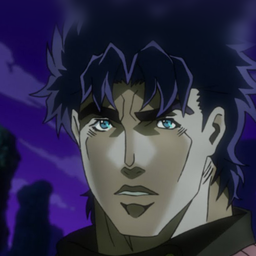

In [90]:
unaligned_img_fn = 'sample_images/jojo.jpg'
for face_landmarks in landmarks_detector.get_landmarks(unaligned_img_fn):
        target_face = image_align(unaligned_img_fn, face_landmarks)
        display(target_face.resize((256,256), Image.LANCZOS))

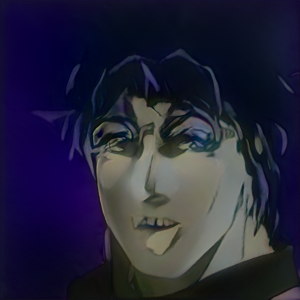

In [91]:
projection(proj, target_face)

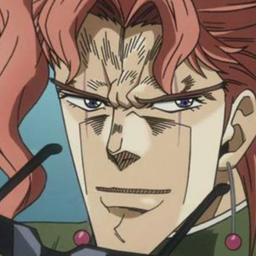

In [75]:
unaligned_img_fn = 'sample_images/花京院.jpg'
for face_landmarks in landmarks_detector.get_landmarks(unaligned_img_fn):
        target_face = image_align(unaligned_img_fn, face_landmarks)
        display(target_face.resize((256,256), Image.LANCZOS))

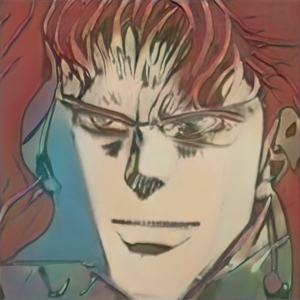

In [76]:
projection(proj, target_face)

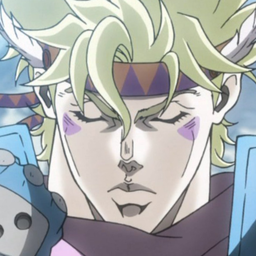

In [86]:
unaligned_img_fn = 'sample_images/西薩.jpg'
for face_landmarks in landmarks_detector.get_landmarks(unaligned_img_fn):
        target_face = image_align(unaligned_img_fn, face_landmarks)
        display(target_face.resize((256,256), Image.LANCZOS))

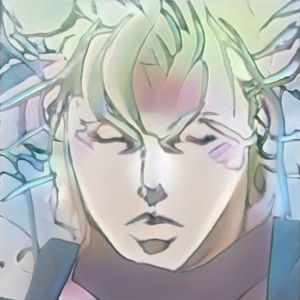

In [88]:
projection(proj, target_face)

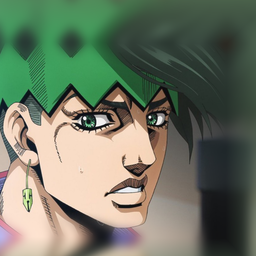

In [70]:
unaligned_img_fn = 'sample_images/露伴.jpg'
for face_landmarks in landmarks_detector.get_landmarks(unaligned_img_fn):
        target_face = image_align(unaligned_img_fn, face_landmarks)
        display(target_face.resize((256,256), Image.LANCZOS))

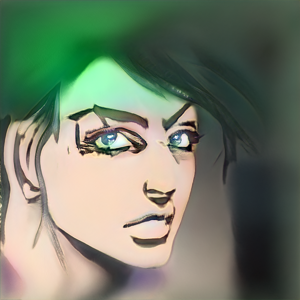

In [71]:
projection(proj, target_face)

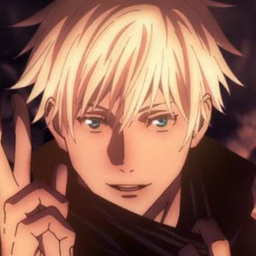

In [84]:
unaligned_img_fn = 'sample_images/五條.jpg'
for face_landmarks in landmarks_detector.get_landmarks(unaligned_img_fn):
        target_face = image_align(unaligned_img_fn, face_landmarks)
        display(target_face.resize((256,256), Image.LANCZOS))

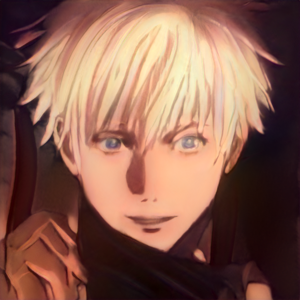

In [85]:
projection(proj, target_face)